FASE 1 — Descubrimiento de variables (ejecutar primero siempre)

In [46]:
# ============================================================
# 1 — Instalación y carga
# ============================================================
!pip install pyreadstat folium -q

import pandas as pd
import pyreadstat

# Ruta del archivo
RUTA = '/content/EH2025_Persona.sav'

df, meta = pyreadstat.read_sav(RUTA)
print(f"✅ Cargado: {len(df):,} registros, {df.shape[1]} variables")

✅ Cargado: 39,485 registros, 276 variables


FASE 2 — Análisis completo  

In [34]:
# ============================================================
# CELDA 3 — MAPEO DE VARIABLES (¡edita aquí los nombres reales!)
# ============================================================
MAPA = {
    # individuales
    'edad':      's01a_03',   # años cumplidos
    'sexo':      's01a_02',   # hombre / mujer
    'idioma':    's01a_07_1', # idioma de mayor uso
    'indigena':  's01a_09',   # autoidentificación indígena
    # geografía
    'depto':     'depto',
    'zona':      'area',      # urbana / rural
    # asistencia REAL
    'asiste':    's03a_04',   # ¿se inscribió/matriculó este año?
    # extra útil para recomendaciones:
    'no_inscribio_motivo': 's03a_05',  # razón de no inscripción
}

# Tomar solo las variables que sí existen
MAPA = {k: v for k, v in MAPA.items() if v is not None and v in df.columns}
#print("Variables en uso:", MAPA)

data = df[list(MAPA.values())].copy()
data.columns = list(MAPA.keys())
#print(data.shape)

print("Etiquetas s03a_04:", meta.variable_value_labels.get('s03a_04'))
print(df['s03a_04'].value_counts().sort_index())

Etiquetas s03a_04: {1.0: '1. Si', 2.0: '2. No'}
s03a_04
1.0    13621
2.0    23864
Name: count, dtype: int64


In [35]:
# ============================================================
# CELDA 4 — Target DESERCIÓN (versión final)
# ============================================================
data = df[list(MAPA.values())].copy()
data.columns = list(MAPA.keys())
data = data.dropna(subset=['edad', 'asiste'])

# Población escolar: 6 a 18 años
pob_escolar = data[data['edad'].between(6, 18)].copy()

# NO asiste = s03a_04 con valor 2 ("No se inscribió/matriculó")
pob_escolar['desercion'] = (pob_escolar['asiste'] == 2).astype(int)

print(f"Población 6-18 años: {len(pob_escolar):,}")
print(f"Tasa de deserción: {pob_escolar['desercion'].mean()*100:.2f}%")
print(pob_escolar['desercion'].value_counts())

Población 6-18 años: 9,895
Tasa de deserción: 3.30%
desercion
0    9568
1     327
Name: count, dtype: int64


In [36]:
# ============================================================
# CELDA 5 — Preparación de features y Modelo Random Forest
# ============================================================
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix

modelo = pob_escolar.copy()

features = [c for c in modelo.columns if c not in ('asiste', 'desercion')]
X = pd.get_dummies(modelo[features].fillna(-1), drop_first=True)
y = modelo['desercion']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y)

rf = RandomForestClassifier(
    n_estimators=300, class_weight='balanced',
    random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

y_pred  = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)[:, 1]

print("ROC-AUC:", round(roc_auc_score(y_test, y_proba), 3))
print(classification_report(y_test, y_pred))

ROC-AUC: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2871
           1       1.00      1.00      1.00        98

    accuracy                           1.00      2969
   macro avg       1.00      1.00      1.00      2969
weighted avg       1.00      1.00      1.00      2969



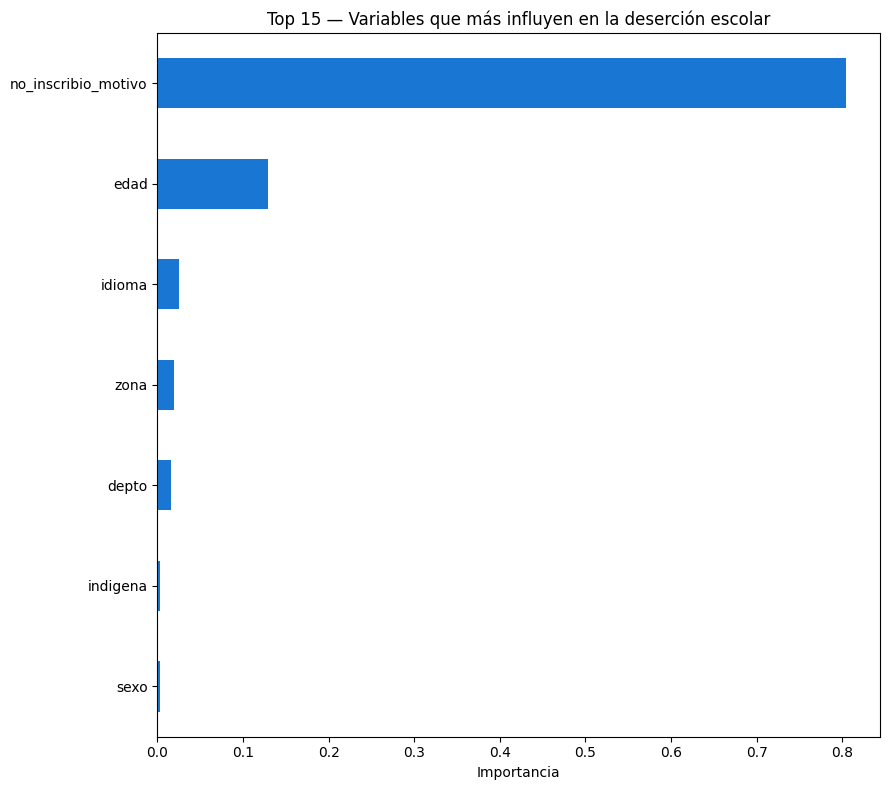

In [37]:
# ============================================================
# CELDA 6 — Importancia de variables
# ============================================================
import matplotlib.pyplot as plt

imp = pd.Series(rf.feature_importances_, index=X.columns).sort_values()
plt.figure(figsize=(9, 8))
imp.tail(15).plot.barh(color='#1976d2')
plt.title('Top 15 — Variables que más influyen en la deserción escolar')
plt.xlabel('Importancia')
plt.tight_layout()
plt.show()

In [40]:
 # ============================================================
# CELDA 7 — Mapa interactivo (versión corregida)
# ============================================================
import folium
import requests
import json

# 1) Tasas de deserción por depto (nombrar con texto para el mapa)
NOMBRES_DEPTO = {
    1: 'Chuquisaca', 2: 'La Paz', 3: 'Cochabamba', 4: 'Oruro',
    5: 'Potosí',     6: 'Tarija', 7: 'Santa Cruz', 8: 'Beni', 9: 'Pando',
}
tasas = (pob_escolar.groupby('depto')['desercion'].mean() * 100).round(2)
tasas_df = tasas.rename(index=NOMBRES_DEPTO).rename_axis('depto').reset_index()
print(tasas_df.sort_values('desercion', ascending=False).to_string(index=False))

# 2) Obtener el GeoJSON de departamentos de Bolivia (vía API de geoBoundaries)
api = requests.get("https://www.geoboundaries.org/api/current/gbOpen/BOL/ADM1/").json()
geo_url = api['gjDownloadURL']
geo = requests.get(geo_url).json()   # dict GeoJSON

# ver nombres que trae el mapa (para hacer match con nuestros nombres)
nombres_geo = [f['properties']['shapeName'] for f in geo['features']]
print("\nNombres en el GeoJSON:", nombres_geo)


# 3) Mapa coroplético
m = folium.Map(location=[-16.7, -64.5], zoom_start=5, tiles='cartodbpositron')

folium.Choropleth(
    geo_data=geo,
    data=tasas_df,
    columns=['depto', 'desercion'],
    key_on='feature.properties.shapeName',   # ajustaremos si los nombres difieren
    fill_color='YlOrRd',
    fill_opacity=0.75,
    line_opacity=0.3,
    legend_name='Tasa de deserción escolar (%) — pobl. 6 a 18 años',
    nan_fill_color='white',
).add_to(m)

m.save('mapa_desercion_bolivia.html')
m

     depto  desercion
Santa Cruz       4.88
     Pando       4.19
      Beni       3.78
Chuquisaca       3.57
    Tarija       3.41
    Potosí       3.40
     Oruro       2.68
    La Paz       2.53
Cochabamba       1.94

Nombres en el GeoJSON: ['Beni', 'Chuquisaca', 'Cochabamba', 'La Paz', 'Oruro', 'Pando', 'Potosí', 'Santa Cruz', 'Tarija']


In [41]:
# ============================================================
# CELDA 8 — Mapa urbano vs rural por departamento (tabla resumen)
# ============================================================
if 'zona' in pob_escolar.columns:
    zona_tabla = pob_escolar.pivot_table(
        index='depto', columns='zona', values='desercion', aggfunc='mean') * 100
    display(zona_tabla.round(2))

zona,1.0,2.0
depto,,
1.0,0.54,7.01
2.0,2.23,4.39
3.0,1.66,3.25
4.0,1.95,4.05
5.0,2.31,4.61
6.0,1.43,8.65
7.0,3.75,12.60
8.0,3.34,5.14
9.0,1.56,6.81


In [42]:
# ============================================================
# CELDA 9 — Clustering de perfiles de riesgo (por depto+zona)
# ============================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Perfil agregado: promedios por departamento y zona
perfil = pob_escolar.groupby(['depto', 'zona'] if 'zona' in pob_escolar else ['depto']).agg(
    tasa_desercion=('desercion', 'mean'),
    edad_promedio=('edad', 'mean'),
).reset_index()

# Agrega otras medias si existen
for col in ['indigena']:
    if col in pob_escolar.columns:
        perfil[col] = pob_escolar.groupby(
            ['depto','zona'] if 'zona' in pob_escolar else ['depto'])[col].mean().values

feats = perfil.drop(columns=['depto'] + (['zona'] if 'zona' in perfil else []))
Xc = StandardScaler().fit_transform(feats.fillna(0))

km = KMeans(n_clusters=3, random_state=42, n_init=10)
perfil['cluster'] = km.fit_predict(Xc)

# Ordena por riesgo
clusters_riesgo = perfil.groupby('cluster')['tasa_desercion'].mean().sort_values()
print("Clusters ordenados de menor a mayor riesgo:")
display(clusters_riesgo)
display(perfil.sort_values('tasa_desercion', ascending=False))

Clusters ordenados de menor a mayor riesgo:


,tasa_desercion
cluster,
0,0.026390
2,0.045478
1,0.093538


,depto,zona,tasa_desercion,edad_promedio,indigena,cluster
13,7.0,2.0,0.126016,11.593496,1.849593,1
11,6.0,2.0,0.086486,11.783784,1.940541,1
1,1.0,2.0,0.070122,12.143293,1.902439,0
17,9.0,2.0,0.068111,11.780186,1.873065,1
15,8.0,2.0,0.051429,11.594286,1.788571,2
9,5.0,2.0,0.046110,11.461095,1.720461,2
3,2.0,2.0,0.043887,11.824451,1.605016,2
7,4.0,2.0,0.040486,11.761134,1.655870,2
12,7.0,1.0,0.037500,12.025595,1.972024,0
14,8.0,1.0,0.033395,12.057514,1.972171,0


In [43]:
# ============================================================
# CELDA 10 — Exportar resultados
# ============================================================
perfil.to_csv('perfiles_riesgo.csv', index=False)
tasas_df.to_csv('tasas_desercion_depto.csv', index=False)

# Descarga directa
from google.colab import files
files.download('perfiles_riesgo.csv')
files.download('mapa_desercion_bolivia.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [45]:
# ============================================================
# CELDA 11 — Recomendaciones de política (redacción guiada)
# ============================================================
print("""
RECOMENDACIONES (ejemplo de estructura — redactar con los resultados reales):

1. Variables top del modelo: [ver Celda 6]
   - Si 'zona rural' domina → becas + transporte escolar en áreas dispersas.
   - Si 'idioma/indígena' domina → fortalecer educación intercultural bilingüe.
   - Si 'ingreso' domina → programas condicionados de transferencia (Bono Juancito Pinto reforzado).

2. Geografías prioritarias: [ver mapa Celda 7]
   → Focalizar intervención en los 3 departamentos con mayor tasa.

3. Clusters de alto riesgo: [ver Celda 9]
   → Intervención personalizada por perfil.
""")


RECOMENDACIONES (ejemplo de estructura — redactar con los resultados reales):

1. Variables top del modelo: [ver Celda 6]
   - Si 'zona rural' domina → becas + transporte escolar en áreas dispersas.
   - Si 'idioma/indígena' domina → fortalecer educación intercultural bilingüe.
   - Si 'ingreso' domina → programas condicionados de transferencia (Bono Juancito Pinto reforzado).

2. Geografías prioritarias: [ver mapa Celda 7]
   → Focalizar intervención en los 3 departamentos con mayor tasa.

3. Clusters de alto riesgo: [ver Celda 9]
   → Intervención personalizada por perfil.



Parte 1: Obtención y Preprocesamiento de Datos (25%)

In [47]:
# ============================================================
# VIZ 1 — Mapa Folium: deserción por depto + capa de población
# ============================================================
import folium, requests
from folium.plugins import MarkerCluster

# Tasas y conteo por depto
resumen_pb = pob_escolar.groupby('depto').agg(
    tasa=('desercion', 'mean'),
    n=('desercion', 'size')
)
resumen_pb['tasa_%'] = (resumen_pb['tasa'] * 100).round(2)

NOMBRES = {1:'Chuquisaca',2:'La Paz',3:'Cochabamba',4:'Oruro',5:'Potosí',
           6:'Tarija',7:'Santa Cruz',8:'Beni',9:'Pando'}
resumen_pb['nombre'] = resumen_pb.index.map(NOMBRES)

# GeoJSON de Bolivia ADM1 (vía API geoBoundaries)
api = requests.get("https://www.geoboundaries.org/api/current/gbOpen/BOL/ADM1/").json()
geo = requests.get(api['gjDownloadURL']).json()

# ⚠️ verifica el campo de nombre dentro del GeoJSON
# (normalmente es 'shapeName'; si falla, imprime para ajustar)
print([f['properties'] for f in geo['features']][:2])

m = folium.Map(location=[-16.7,-64.5], zoom_start=5, tiles='cartodbpositron')

# --- Capa 1: choropleth deserción ---
folium.Choropleth(
    geo_data=geo, data=resumen_pb,
    columns=['nombre','tasa_%'],
    key_on='feature.properties.shapeName',
    fill_color='YlOrRd', fill_opacity=0.75, line_opacity=0.3,
    legend_name='% deserción 6-18 años'
).add_to(m)

# --- Capa 2: marcadores de volumen por depto (centros aprox.) ---
centros = {'Chuquisaca':(-19.0,-64.3),'La Paz':(-16.3,-68.1),
           'Cochabamba':(-17.4,-65.9),'Oruro':(-18.1,-67.0),
           'Potosí':(-20.5,-65.7),'Tarija':(-21.5,-64.3),
           'Santa Cruz':(-17.8,-63.0),'Beni':(-14.8,-64.9),'Pando':(-11.0,-68.7)}
mc = MarkerCluster(name='Población en muestra').add_to(m)
for _, r in resumen_pb.iterrows():
    lat, lon = centros.get(r['nombre'], (-16.5,-64.5))
    folium.CircleMarker([lat, lon], radius=r['n']**0.5/2,
                        color='#1976d2', fill=True,
                        popup=f"{r['nombre']}: {r['tasa_%']}% deserción (n={int(r['n'])})"
                       ).add_to(mc)

folium.LayerControl().add_to(m)
m.save('viz1_mapa_desercion.html'); m

[{'shapeName': 'Beni', 'shapeISO': 'BO-B', 'shapeID': '26024454B17172096462676', 'shapeGroup': 'BOL', 'shapeType': 'ADM1'}, {'shapeName': 'Chuquisaca', 'shapeISO': 'BO-H', 'shapeID': '26024454B30905576957948', 'shapeGroup': 'BOL', 'shapeType': 'ADM1'}]


**Visualización 2 — Barras comparativas (zona / sexo / departamento)**

/tmp/ipykernel_1035/1209399022.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tmp, x='zona_txt', y='desercion', ax=axes[0], palette='Blues')
/tmp/ipykernel_1035/1209399022.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tmp, x='sexo_txt', y='desercion', ax=axes[1], palette='Greens')
/tmp/ipykernel_1035/1209399022.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=tmp, x='depto_txt', y='desercion', order=orden,


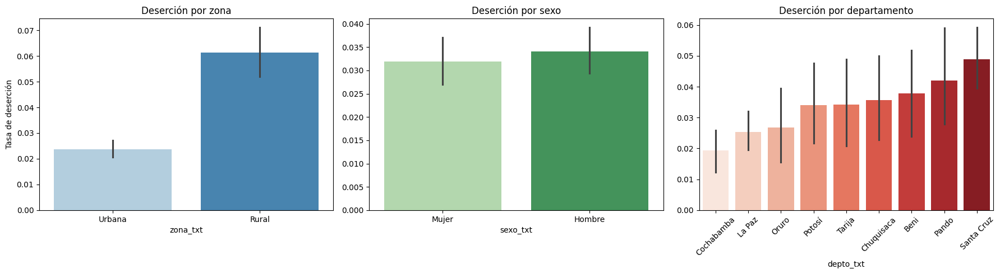

In [48]:
# ============================================================
# VIZ 2 — Barras: deserción por zona, sexo y departamento
# ============================================================
import matplotlib.pyplot as plt
import seaborn as sns

tmp = pob_escolar.copy()
tmp['zona_txt']  = tmp['zona'].map({1:'Urbana',2:'Rural'})
tmp['sexo_txt']  = tmp['sexo'].map({1:'Hombre',2:'Mujer'})
tmp['depto_txt'] = tmp['depto'].map(NOMBRES)

fig, axes = plt.subplots(1, 3, figsize=(18,5))

sns.barplot(data=tmp, x='zona_txt', y='desercion', ax=axes[0], palette='Blues')
axes[0].set_title('Deserción por zona'); axes[0].set_ylabel('Tasa de deserción')

sns.barplot(data=tmp, x='sexo_txt', y='desercion', ax=axes[1], palette='Greens')
axes[1].set_title('Deserción por sexo'); axes[1].set_ylabel('')

orden = tmp.groupby('depto_txt')['desercion'].mean().sort_values().index
sns.barplot(data=tmp, x='depto_txt', y='desercion', order=orden,
            ax=axes[2], palette='Reds')
axes[2].set_title('Deserción por departamento')
axes[2].tick_params(axis='x', rotation=45); axes[2].set_ylabel('')

plt.tight_layout(); plt.show()

** Visualización 3 — Relación: tasa de deserción por edad**

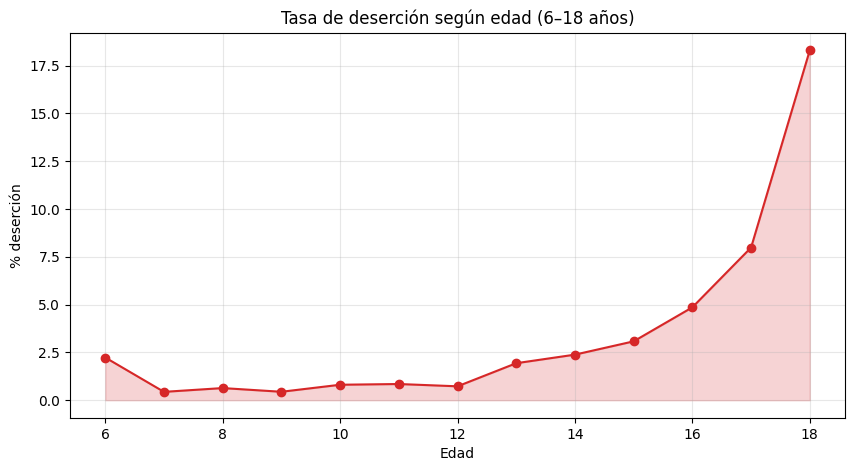

In [49]:
# ============================================================
# VIZ 3 — Tasa de deserción por edad (curva 6-18 años)
# ============================================================
tasa_edad = pob_escolar.groupby('edad')['desercion'].mean() * 100

plt.figure(figsize=(10,5))
plt.plot(tasa_edad.index, tasa_edad.values, marker='o', color='#d62728')
plt.fill_between(tasa_edad.index, tasa_edad.values, alpha=0.2, color='#d62728')
plt.title('Tasa de deserción según edad (6–18 años)')
plt.xlabel('Edad'); plt.ylabel('% deserción')
plt.grid(alpha=0.3); plt.show()

**Visualización 4 — Clustering (K-means) + vista 2D + mapa**

          tasa     n  edad_media  rural  indig
cluster                                       
2.0      0.044  1109      12.691  1.472    1.0
0.0      0.034  4514      11.986  1.226    2.0
1.0      0.029  4272      12.018  1.212    2.0


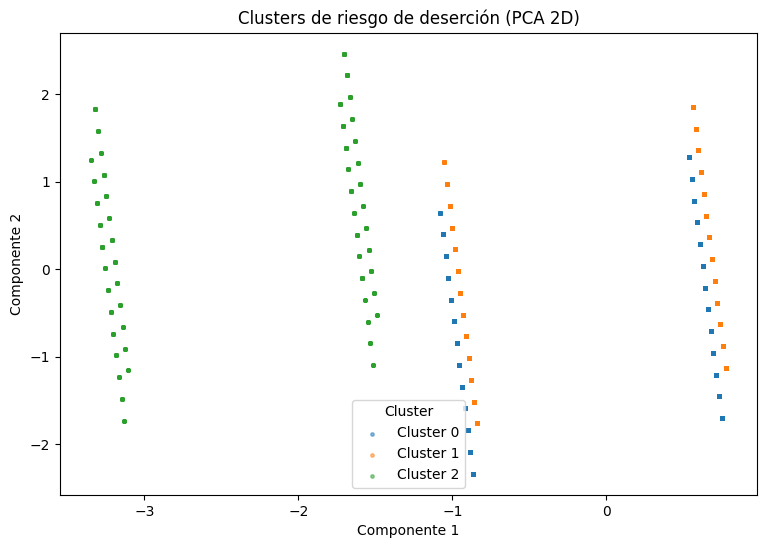

TypeError: DataFrame.pivot_table() got an unexpected keyword argument 'normalize'

In [50]:
# ============================================================
# VIZ 4 — K-Means de perfiles individuales (6-18 años)
# ============================================================
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Features del individuo
Xc = pob_escolar[['edad','sexo','zona','indigena']].dropna()
Xs = StandardScaler().fit_transform(Xc)

km = KMeans(n_clusters=3, random_state=42, n_init=10)
labels = km.fit_predict(Xs)
pob_escolar.loc[Xc.index, 'cluster'] = labels

# Interpretar: tasa de deserción por cluster
perfil_cluster = pob_escolar.groupby('cluster').agg(
    tasa=('desercion','mean'), n=('desercion','size'),
    edad_media=('edad','mean'), rural=('zona','mean'), indig=('indigena','mean')
).round(3)
print(perfil_cluster.sort_values('tasa', ascending=False))

# Reducción a 2D y gráfico
pca = PCA(n_components=2, random_state=42)
pts = pca.fit_transform(Xs)

plt.figure(figsize=(9,6))
for c in sorted(set(labels)):
    m = labels == c
    plt.scatter(pts[m,0], pts[m,1], s=6, alpha=0.5, label=f'Cluster {c}')
plt.legend(title='Cluster')
plt.title('Clusters de riesgo de deserción (PCA 2D)')
plt.xlabel('Componente 1'); plt.ylabel('Componente 2')
plt.show()

# % de cada cluster por depto (para ver distribución geográfica)
tabla = pob_escolar.pivot_table(index='depto', columns='cluster',
                                values='desercion', aggfunc='size', normalize='index') * 100
tabla = tabla.rename(index=NOMBRES).round(1)
print("\nDistribución de clusters por departamento (%):")
display(tabla)

tabla.plot(kind='bar', stacked=True, figsize=(11,5))
plt.title('Composición de clusters por departamento')
plt.ylabel('%'); plt.xticks(rotation=45); plt.legend(title='Cluster')
plt.tight_layout(); plt.show()